Автор: Лейман М.А.   
Дата создания: 10.05.2025  
 
# Задание № 2.




Предоставлен __датасет__ — https://github.com/weihancug/10-category-UAV-small-weak-object-detection-dataset-UAVOD10, полученный с БПЛА.  


__Статья__ — https://doi.org/10.1016/j.jag.2022.102966  

__Особенность__ — отностительно большое количество объектов на каждом кадре.  

__Задача__  — разработать алгоритм детектирования размеченных объектов, который будет применятся на борту БПЛА в реальном времени.  



__Минимальные требования:__  
    • 1. Разбить датасет на обучение/валидацию/тест  
    • 2. Подобрать архитектуру сети с учётом ограничений на производительность  
    • 3. Обучить модель  
    • 4. Сгенерировать примеры работы модели на тестовых данных  
    • 5. Создать проект в гитхабе   

**Дополнительные улучшения:**  
    •Обогатить датасет новыми данными найденными самостоятельно.  
    •Обучить несколько разных моделей сравнить результаты.  
    •Предложить варианты как можно улучшить результат.  

## Содержание работы:  

1.  Обработка датасета  -  __1_processing.ipynb__  

2.  Просмотр изображений с боксами - __2_visualize_img.ipynb__  

3.  Создание видео - __3_video_creation.ipynb__  

4. Модели детекции:  

    4.1. Модель MobileNet - __4_1_custom_mobileNet_detect.ipynb__  

    4.2. Упрощённая модель  детекции. Обнаружение объектов в ячейках  - __4_2_grid_net.ipynb__

    4.3.  Модель Yolo  - __4_3_yolo_s.ipynb__  

    4.4. Модель FasterCNN - __4_4_fasterrcnn_mobileNet_detect.ipynb__  
 
    
5.  Детекция объектов на видео  -  __5_detection.ipynb__  

6.  Экспорт модели -  __6_deployment_yolo.ipynb__  

7.  Разметка изображений - __creation_boxes.py__


# 1. Разделение датасета  
- Данные с трёх датасетов были объеденены в один.  Классы обработанны (размечены, удалены лишние классы).  
- Датасет в ручную разделён на train test 

In [1]:
import os
# Получаем текущую рабочую папку  
current_directory = os.getcwd()  
path_dataset = os.path.join(current_directory, "data/dataset/dataset_full_1")

image_train = 'images/train/'    # train изображения
image_train_dir = os.path.join(path_dataset, image_train)  
target_train= 'target/train/'    
target_train_dir = os.path.join(path_dataset, target_train) 

image_test = 'images/test/'    # test изображения
image_test_dir = os.path.join(path_dataset, image_test)  
target_test= 'target/test/'    
target_test_dir = os.path.join(path_dataset, target_test) 

image_val = 'images/val/'    # test изображения
image_val_dir = os.path.join(path_dataset, image_val)  
target_val= 'target/val/'    
target_val_dir = os.path.join(path_dataset, target_val) 


train_images = len([f for f in os.listdir(image_train_dir) if f.endswith('.jpg')])
train_masks = len([f for f in os.listdir(target_train_dir) if f.endswith('.txt')])
test_images = len([f for f in os.listdir(image_test_dir) if f.endswith('.jpg')])
test_masks = len([f for f in os.listdir(target_test_dir) if f.endswith('.txt')])
val_images = len([f for f in os.listdir(image_val_dir) if f.endswith('.jpg')])
val_masks = len([f for f in os.listdir(target_val_dir) if f.endswith('.txt')])

print('Train images:', train_images)
print('Train masks:', train_masks)
print('Test images:', test_images)
print('Test masks:', test_masks)
print('Val images:', val_images)
print('Val masks:', val_masks)

Train images: 6683
Train masks: 6683
Test images: 2577
Test masks: 2577
Val images: 2739
Val masks: 2739


# 2. Подбор модели

### Модели для данной задачи с ограничением __30 GFLOPs__  
- Yolo11s  
- fasterrcnn_mobilenet_v3_large_fpn  
- custom MobileNet    
- custom GridNet  

# 3. Обучение модели Yolo с добавлением данных, по этапам

## Датасет  UAVOD

Предоставленный датасет __UAVOD-10__  содержит 844 изображения   10 классов объектов.   

### Классы датасета  
'building': 0,      		здание  
'cable-tower': 1, 		кабельная вышка  
'cultivation-mesh-cage': 2,  	сетка для выращивания  
'landslide': 3, 		оползень  
'pool': 4, 			бассейн  
'prefabricated-house': 5, 	сборный-дом"  
'quarry': 6,			карьер  
'ship': 7, 			корабль  
'vehicle': 8,			транспортное средство  
'well': 9			колодец  



### Баланс классов  

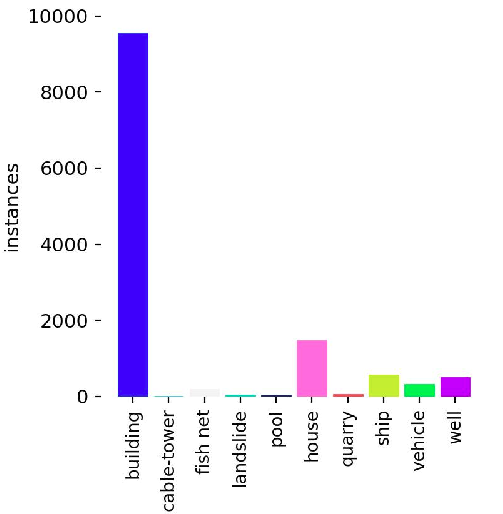 


### Итоги обучения. Метрики на тестовом наборе модель Yolo11s.

=== Итоговые метрики по тестовому набору UAVOD __начальный dataset__ ===    100 Эпох.  
Средняя точность (Precision): 0.439  
Средняя полнота (Recall): 0.364  
Средняя AP50 (IoU=0.50): 0.345  
Средний mAP50-95: 0.186  

### Баланс классов после расширения датасета (аугментаций)  

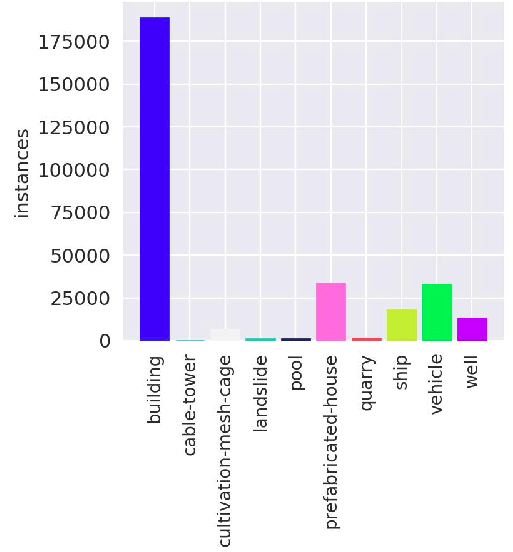  

### Итоги обучения. Метрики на тестовом наборе модель Yolo11s.

=== Итоговые метрики по тестовому набору UAVOD __UAVOD__  после аугментаций ===  
Средняя точность (Precision): 0.818  
Средняя полнота (Recall): 0.624  
Средняя AP50 (IoU=0.50): 0.691  
Средний mAP50-95: 0.435  

####  При обрезке изображения  боксы могут не корректно  обводить объект  

Видно что реальный бокс (зелёный) был шире, и в результате  обрезки изображения бокс охватывает большую область чем нужно.

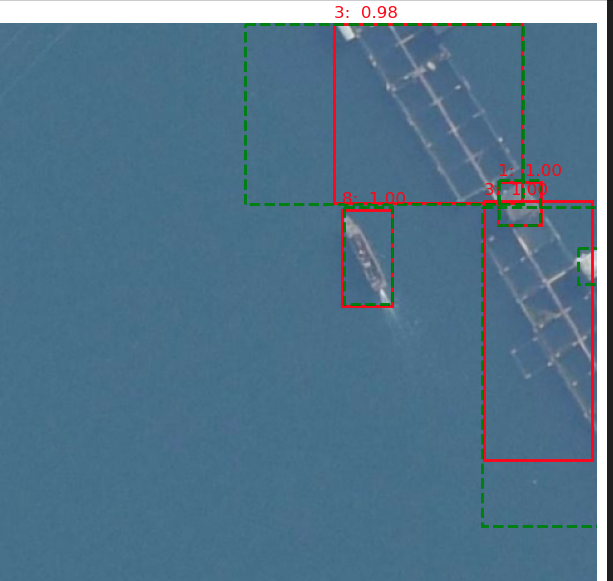 

## Датасет DOTA  
Данные - https://captain-whu.github.io/DOTA/dataset.html  


Статья - https://captain-whu.github.io/DOAI2019/dataset.html   


### Баланс классов после объединения с датасетом  DOTA  

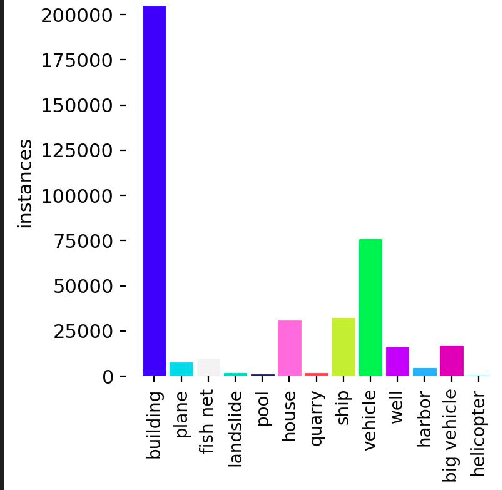  

### Итоги обучения, модель Yolo11s.   
=== Итоговые метрики по тестовому набору  ===   
Средняя точность (Precision): 0.907  
Средняя полнота (Recall): 0.734  
Средняя AP50 (IoU=0.50): 0.812  
Средний mAP50-95: 0.564  

## 2. Датасет VEDAI  

https://paperswithcode.com/dataset/vedai  


### Баланс классов после объединения с датасетом  VEDAI и DOTA  
Удалены классы "карьер", "оползень", "водоём".  


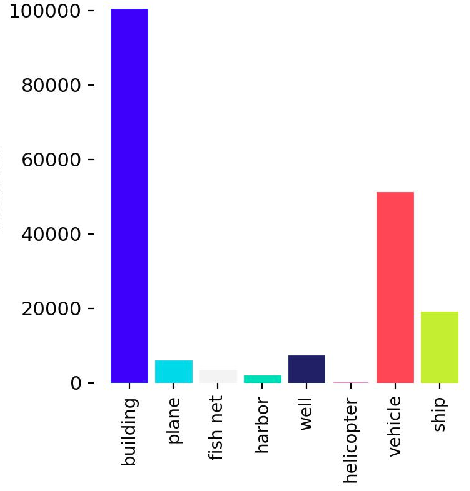  

### Итоги обучения, модель Yolo11s.   
=== Итоговые метрики по тестовому набору  ===   
Средняя точность (Precision): 0.919  
Средняя полнота (Recall): 0.844  
Средняя AP50 (IoU=0.50): 0.891  
Средний mAP50-95: 0.642   

##  Пример работы модели  

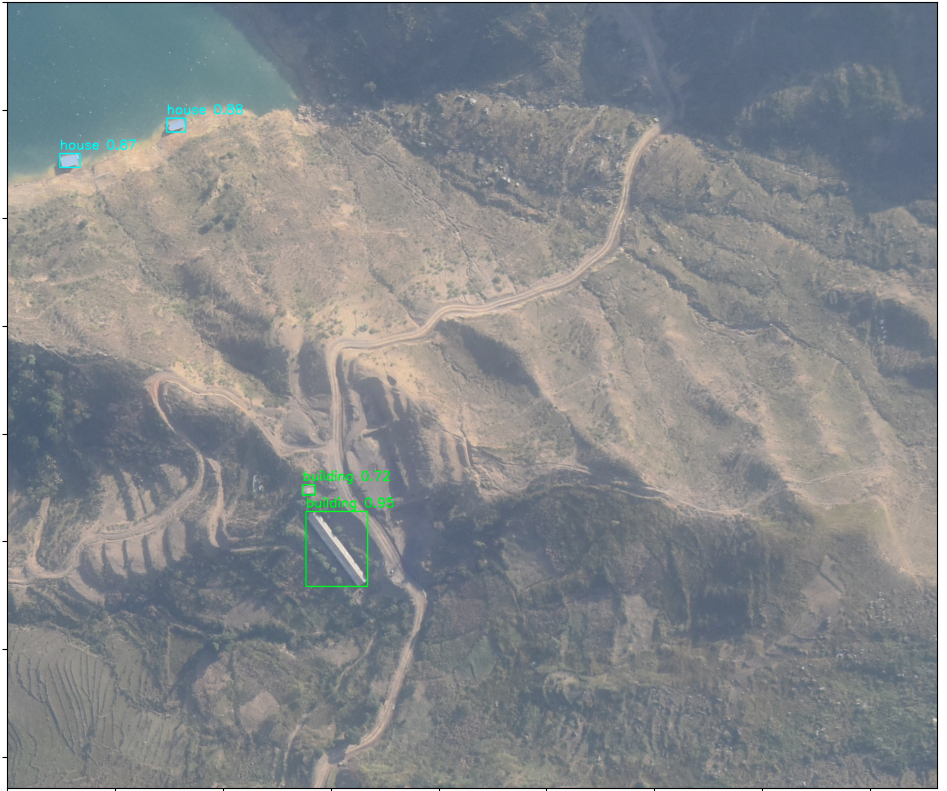 
 

# Другие модели  



### Итоги обучения, модель Yolo12n.   
=== Итоговые метрики по тестовому набору  ===   
Средняя точность (Precision): 0.864  
Средняя полнота (Recall): 0.771  
Средняя AP50 (IoU=0.50): 0.815  
Средний mAP50-95: 0.543   
 

### Модель __MobileNet Faster R-CNN__   
=== Итоговые метрики по тестовому набору  ===   
Test IoU=0.6409 | Precision=0.7814 | Recall=0.6690  



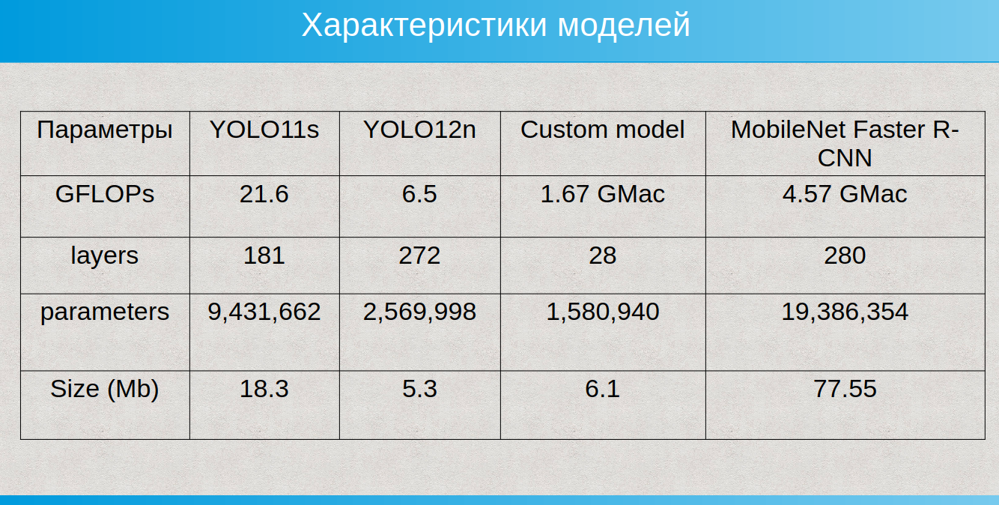   



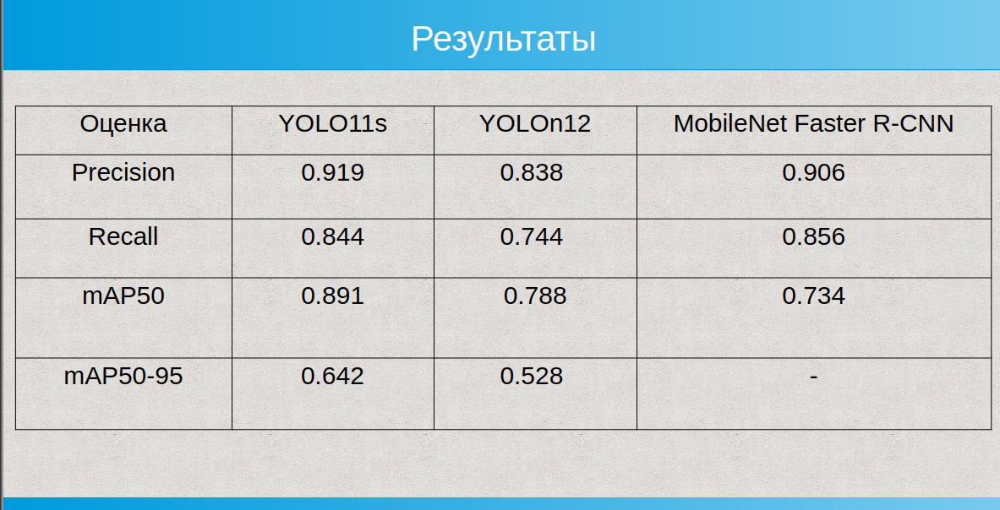 


## Метрики  Grid Net   

Val Prec: 0.3904 | Val Recall: 0.5701

# 4. Примеры работы на тестовых данных

##  Сравнение 

### Yolo11s 

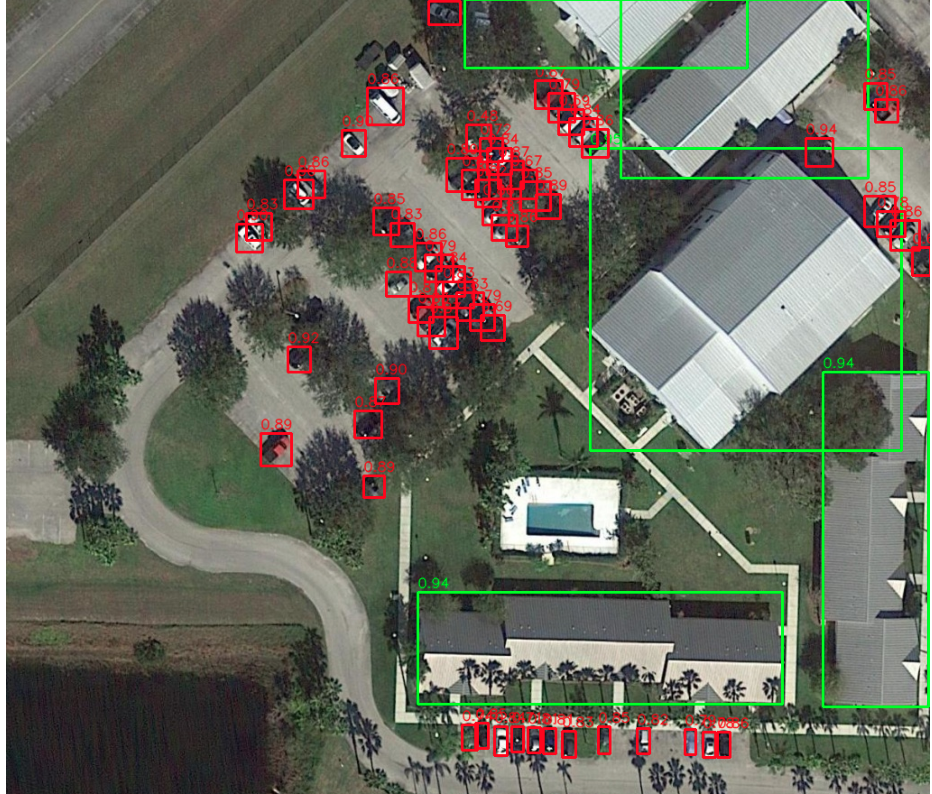 

## Faster R CNN 

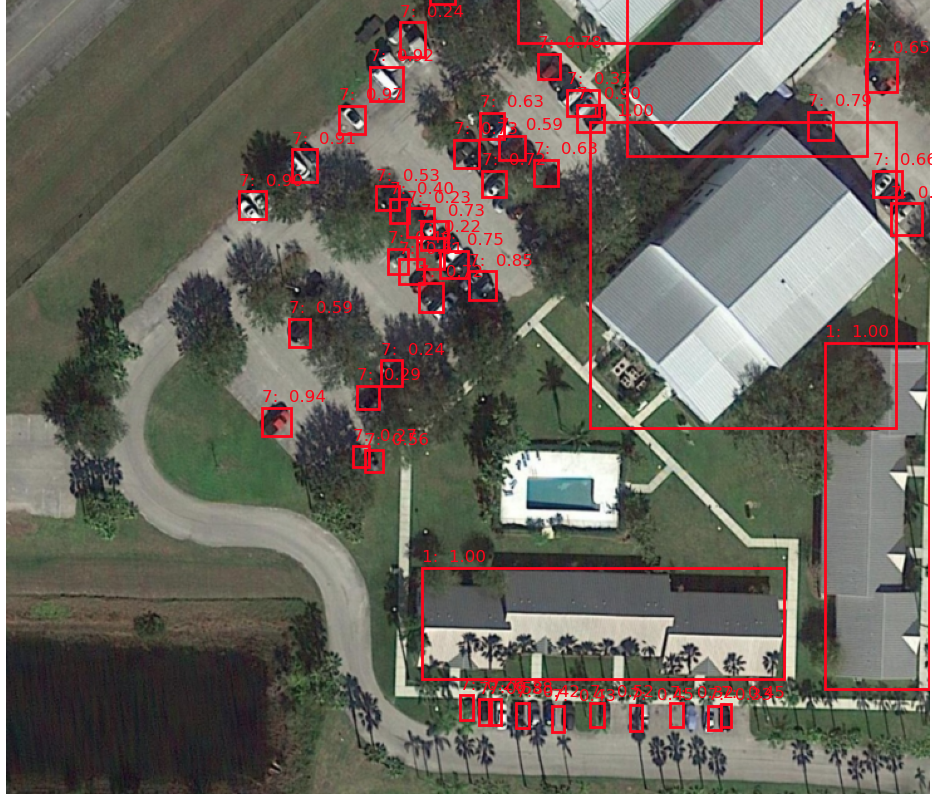  

## custom mobileNet

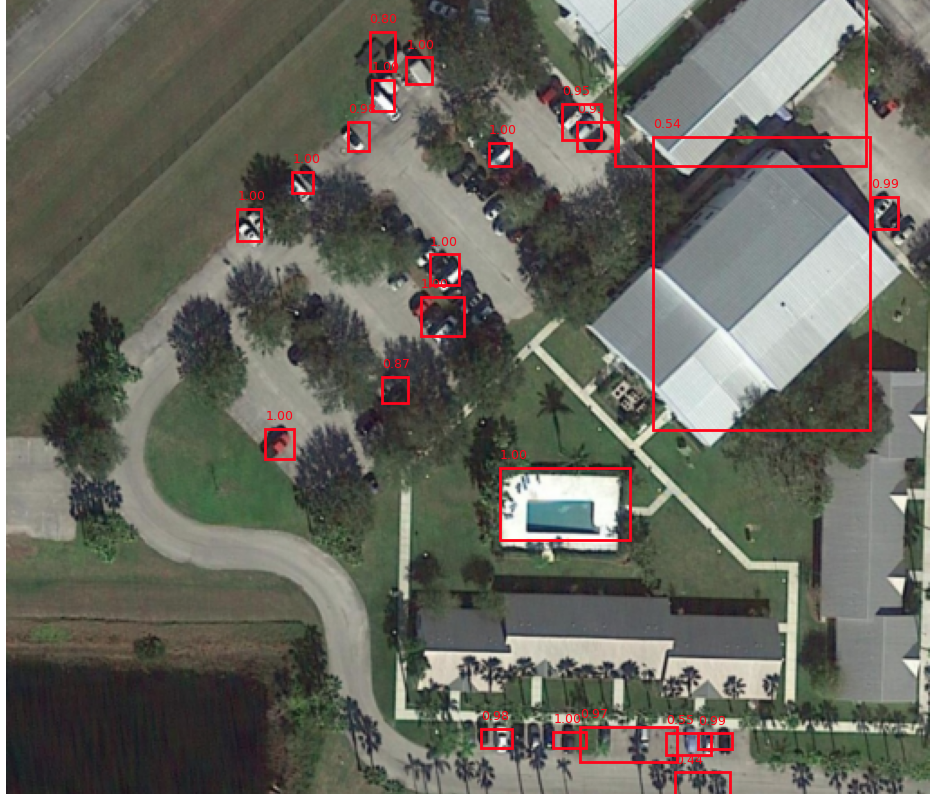 


## grid_net  


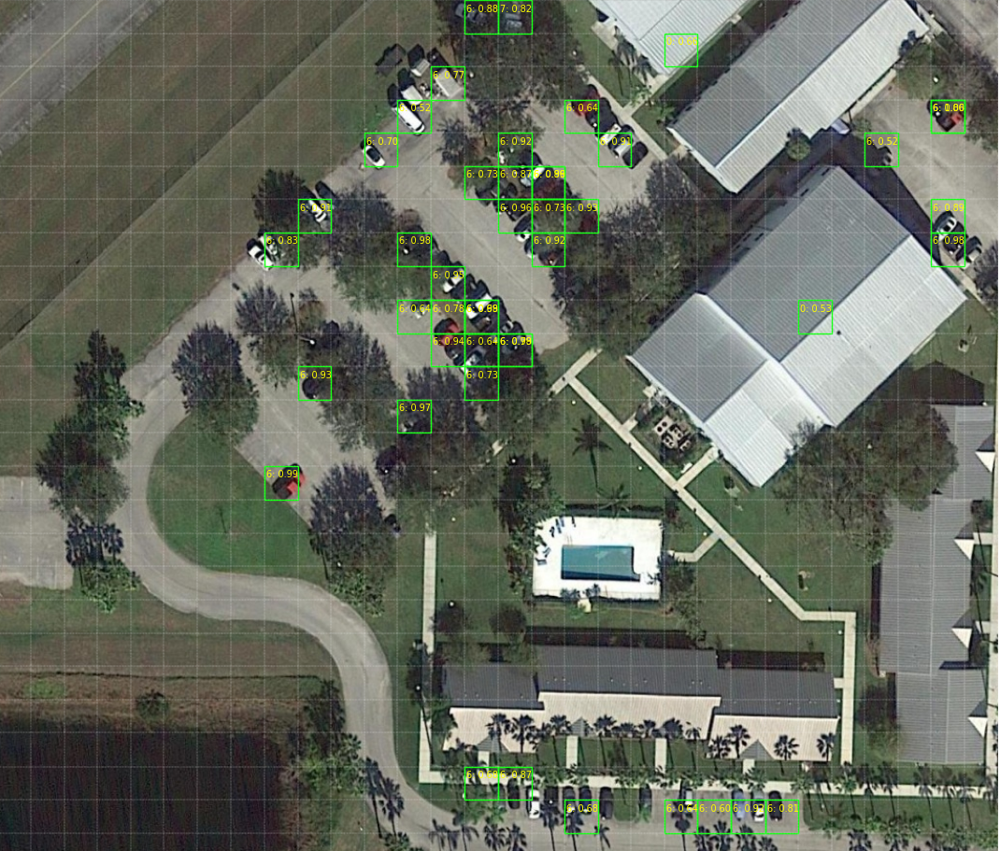  

# 5. GitHub  
проект выложен в Github  

https://github.com/MALeyman/Zala_task 

# Дополнительно:  
### реализация работы модели в вэб интерфейсе  


[Сайт](https://leimansite.pythonanywhere.com/detection2/?model=yolo)

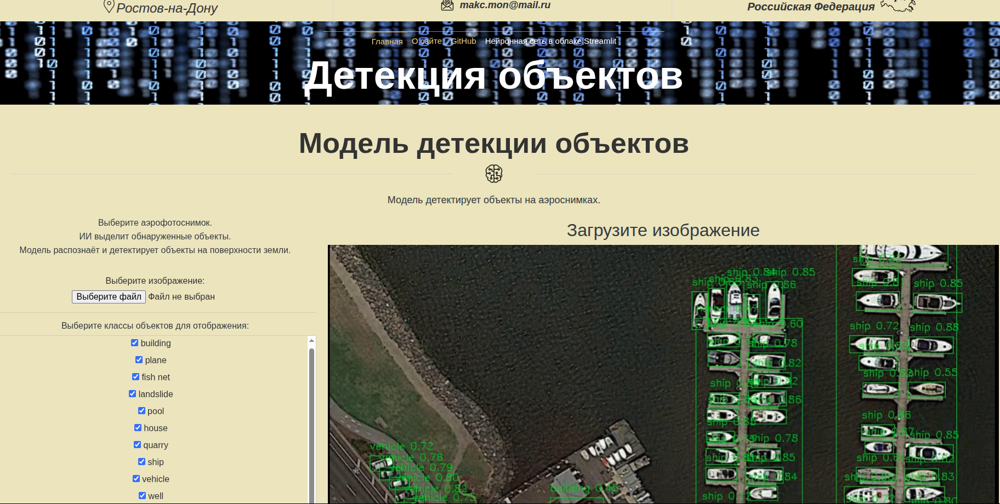 

[gradio](https://huggingface.co/spaces/makc-mon173/projects)

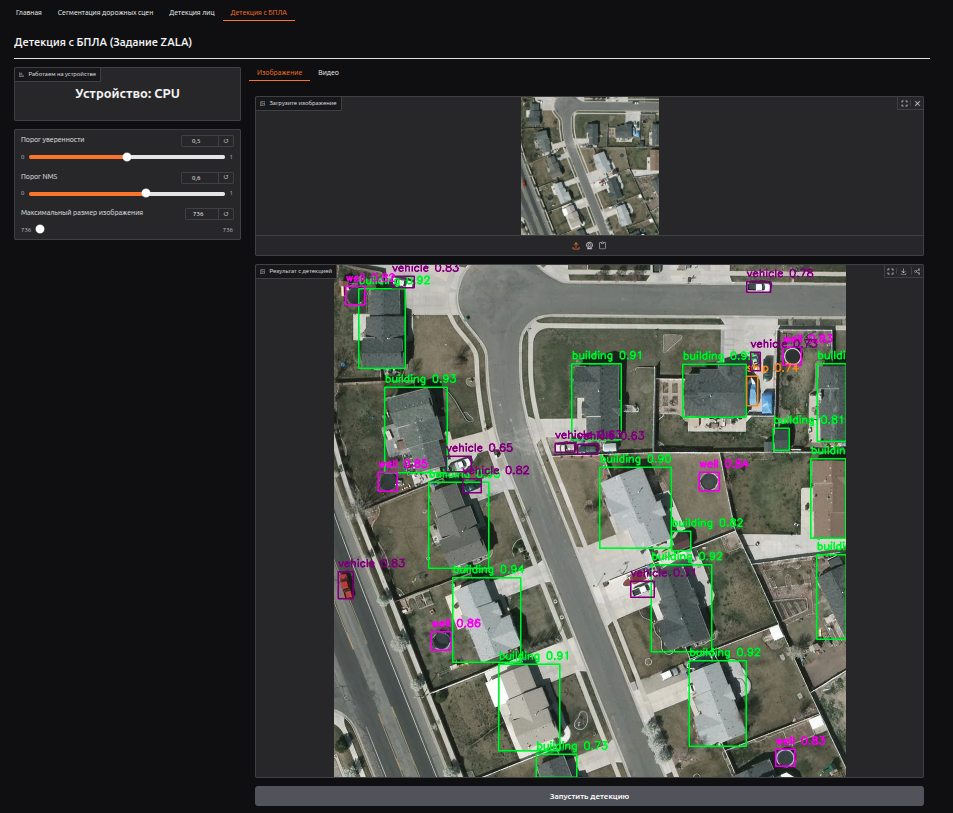 

# Дополнительно  
## разметка изображений

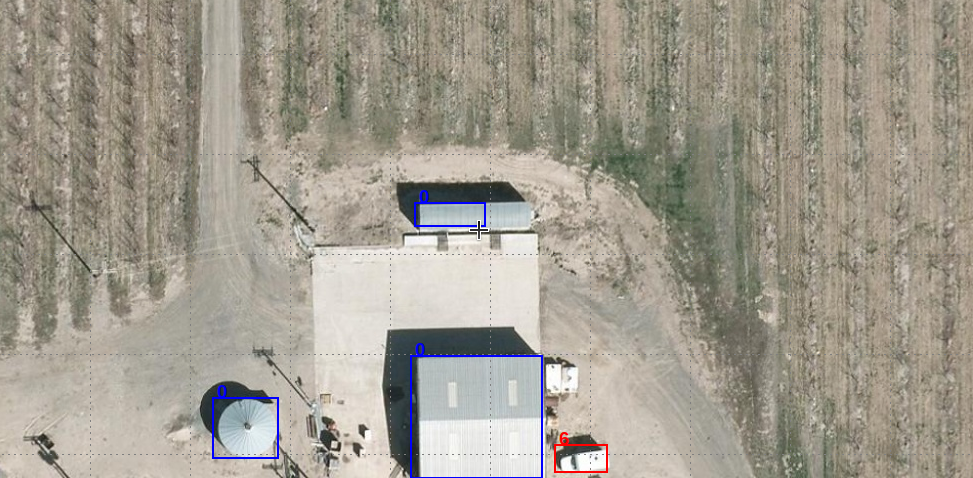  

In [4]:
from utils.creation_boxes import YOLOAnnotatorApp

app = YOLOAnnotatorApp(
    images_path="/home/maksim/develops/python/Zala_task/Zala_task/data/dataset/dataset_full_1/images/train/",
    labels_path="/home/maksim/develops/python/Zala_task/Zala_task/data/dataset/dataset_full_1/target/train/",
    output_images_dir="/home/maksim/develops/python/Zala_task/Zala_task/data/output_images",
    output_labels_dir="/home/maksim/develops/python/Zala_task/Zala_task/data/output_labels",
    window_title="YOLO Аннотации"
)
app.run()


Загрузка: /home/maksim/develops/python/Zala_task/Zala_task/data/dataset/dataset_full_1/images/train/00000000_1_crop0.jpg


## Детекция видео

In [1]:
from utils.visualize_img import video_detection

s_model_path_UAVOD_6 = "data/models/11s_best_UAVOD6.pt"
target_classes=['building',  'house',  'ship', 'vehicle', 'well', 'harbor', 'big vehicle']

video_detection(s_model_path_UAVOD_6, video_path = "data/videos/video_in/video_12.avi", output_video_path = "data/videos/video_out/video_yolo_s_UAVOD_231.avi", target_classes=target_classes)